# OBJECT DETECTION

### What we have

In [1]:
import json

# Path to the COCO JSON annotation file
coco_json_path = 'annotations/instances_train2017.json'

# Load the COCO JSON file
with open(coco_json_path, 'r') as f:
    coco_data = json.load(f)

# Print a sample from each section
print("Sample Image Data:\n", coco_data['images'][10000])
print("\nSample Annotation Data:\n", coco_data['annotations'][10000])
print("\nSample Category Data:\n", coco_data['categories'][0])

Sample Image Data:
 {'license': 4, 'file_name': '000000471488.jpg', 'coco_url': 'http://images.cocodataset.org/train2017/000000471488.jpg', 'height': 480, 'width': 640, 'date_captured': '2013-11-15 21:47:34', 'flickr_url': 'http://farm7.staticflickr.com/6233/6286490251_4bbcaf234f_z.jpg', 'id': 471488}

Sample Annotation Data:
 {'segmentation': [[144.81, 209.47, 144.81, 195.12, 146.95, 193.31, 148.76, 193.47, 150.25, 195.45, 149.75, 221.18, 150.08, 236.02, 149.92, 236.84, 152.65, 242.43, 156.03, 245.82, 156.46, 249.63, 144.6, 250.05, 144.81, 247.09, 146.72, 244.34, 148.2, 242.01, 144.6, 209.84]], 'area': 276.2696000000003, 'iscrowd': 0, 'image_id': 552563, 'bbox': [144.6, 193.31, 11.86, 56.74], 'category_id': 50, 'id': 705139}

Sample Category Data:
 {'supercategory': 'person', 'id': 1, 'name': 'person'}


# Pre processing and converting the annotations to YOLO format

In [2]:
import json
import os
from pycocotools.coco import COCO

### for training annotations

In [16]:
# Paths to the COCO dataset and where you want to save the YOLO-formatted annotations
coco_annotations_path = 'annotations/instances_train2017.json'
images_dir = 'train/images'
output_dir = 'yolo/train'


In [6]:
# Load COCO annotations
coco = COCO(coco_annotations_path)

loading annotations into memory...
Done (t=6.57s)
creating index...
index created!


In [18]:
# Get the class IDs and their corresponding names
categories = coco.loadCats(coco.getCatIds())
class_names = [cat['name'] for cat in categories]
class_id_map = {cat['id']: i for i, cat in enumerate(categories)}

In [19]:
print(categories)

[{'supercategory': 'person', 'id': 1, 'name': 'person'}, {'supercategory': 'vehicle', 'id': 2, 'name': 'bicycle'}, {'supercategory': 'vehicle', 'id': 3, 'name': 'car'}, {'supercategory': 'vehicle', 'id': 4, 'name': 'motorcycle'}, {'supercategory': 'vehicle', 'id': 5, 'name': 'airplane'}, {'supercategory': 'vehicle', 'id': 6, 'name': 'bus'}, {'supercategory': 'vehicle', 'id': 7, 'name': 'train'}, {'supercategory': 'vehicle', 'id': 8, 'name': 'truck'}, {'supercategory': 'vehicle', 'id': 9, 'name': 'boat'}, {'supercategory': 'outdoor', 'id': 10, 'name': 'traffic light'}, {'supercategory': 'outdoor', 'id': 11, 'name': 'fire hydrant'}, {'supercategory': 'outdoor', 'id': 13, 'name': 'stop sign'}, {'supercategory': 'outdoor', 'id': 14, 'name': 'parking meter'}, {'supercategory': 'outdoor', 'id': 15, 'name': 'bench'}, {'supercategory': 'animal', 'id': 16, 'name': 'bird'}, {'supercategory': 'animal', 'id': 17, 'name': 'cat'}, {'supercategory': 'animal', 'id': 18, 'name': 'dog'}, {'supercategory

In [29]:
nc = len(categories)
print(nc)

80


In [30]:
names = [category['name'] for category in categories]

In [31]:
print(names)

['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


In [21]:
# Convert annotations for each image
for image_id in coco.getImgIds():
    image_info = coco.loadImgs(image_id)[0]
    annotation_ids = coco.getAnnIds(imgIds=image_id)
    annotations = coco.loadAnns(annotation_ids)
    
    image_width = image_info['width']
    image_height = image_info['height']
    
    # Prepare YOLO annotation lines
    yolo_annotations = []
    
    for annotation in annotations:
        if 'bbox' in annotation and annotation['bbox']:
            class_id = class_id_map[annotation['category_id']]
            bbox = annotation['bbox']
            # COCO format: [x_min, y_min, width, height]
            x_min, y_min, width, height = bbox
            # Convert to YOLO format [x_center, y_center, width, height] normalized
            x_center = (x_min + width / 2) / image_width
            y_center = (y_min + height / 2) / image_height
            width /= image_width
            height /= image_height
            
            yolo_annotations.append(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")
    
    # Save YOLO annotations to a .txt file
    output_path = os.path.join(output_dir, f"{os.path.splitext(image_info['file_name'])[0]}.txt")
    with open(output_path, 'w') as f:
        f.write("\n".join(yolo_annotations))

    

print("Conversion complete!")

Conversion complete!


### for validation annotations

In [22]:
# Paths to the COCO dataset and where you want to save the YOLO-formatted annotations
coco_annotations_path = 'annotations/instances_val2017.json'
images_dir = 'val/images'
output_dir = 'yolo/val'

In [23]:
coco = COCO(coco_annotations_path)

loading annotations into memory...
Done (t=2.20s)
creating index...
index created!


In [24]:
# Get the class IDs and their corresponding names
categories = coco.loadCats(coco.getCatIds())
class_names = [cat['name'] for cat in categories]
class_id_map = {cat['id']: i for i, cat in enumerate(categories)}

In [ ]:
print(categories)

In [27]:
# Convert annotations for each image
for image_id in coco.getImgIds():
    image_info = coco.loadImgs(image_id)[0]
    annotation_ids = coco.getAnnIds(imgIds=image_id)
    annotations = coco.loadAnns(annotation_ids)
    
    image_width = image_info['width']
    image_height = image_info['height']
    
    # Prepare YOLO annotation lines
    yolo_annotations = []
    
    for annotation in annotations:
        if 'bbox' in annotation and annotation['bbox']:
            class_id = class_id_map[annotation['category_id']]
            bbox = annotation['bbox']
            # COCO format: [x_min, y_min, width, height]
            x_min, y_min, width, height = bbox
            # Convert to YOLO format [x_center, y_center, width, height] normalized
            x_center = (x_min + width / 2) / image_width
            y_center = (y_min + height / 2) / image_height
            width /= image_width
            height /= image_height
            
            yolo_annotations.append(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")
    
    # Save YOLO annotations to a .txt file
    output_path = os.path.join(output_dir, f"{os.path.splitext(image_info['file_name'])[0]}.txt")
    with open(output_path, 'w') as f:
        f.write("\n".join(yolo_annotations))

    

print("Conversion complete!")

Conversion complete!


### Creating train and val data folders

In [2]:
import os
import shutil
import random

In [3]:
# Paths to the source directories containing images and annotations
source_image_dir = 'train/'  
source_annotation_dir = 'yolo/train/' 

In [4]:
# Paths to the new directories
destination_image_train_dir = 'yolov5/yolo_data/images/train/'
destination_annotation_train_dir = 'yolov5/yolo_data/labels//train/'
destination_image_val_dir = 'yolov5/yolo_data/images/val/'
destination_annotation_val_dir = 'yolov5/yolo_data/labels/val/'

In [5]:
# Number of images to select for training and validation
num_train = 5000
num_val = 1000

In [7]:
# Get list of all image files
image_files = [f for f in os.listdir(source_image_dir) if f.endswith('.jpg')]  

In [8]:
# Shuffle and split the list of image files
random.shuffle(image_files)
train_files = image_files[:num_train]
val_files = image_files[num_train:num_train + num_val]

In [9]:
# Function to move files
def move_files(file_list, src_image_dir, src_annotation_dir, dest_image_dir, dest_annotation_dir):
    for file_name in file_list:
        # Move image
        src_image_path = os.path.join(src_image_dir, file_name)
        dest_image_path = os.path.join(dest_image_dir, file_name)
        shutil.copy(src_image_path, dest_image_path)

        # Move annotation
        annotation_file = file_name.replace('.jpg', '.txt')  # Adjust if using different extensions
        src_annotation_path = os.path.join(src_annotation_dir, annotation_file)
        dest_annotation_path = os.path.join(dest_annotation_dir, annotation_file)
        if os.path.exists(src_annotation_path):
            shutil.copy(src_annotation_path, dest_annotation_path)
        else:
            print(f"Warning: Annotation file {annotation_file} not found.")
            

In [10]:
# Move training files
move_files(train_files, source_image_dir, source_annotation_dir, destination_image_train_dir, destination_annotation_train_dir)

In [11]:
# Move validation files
move_files(val_files, source_image_dir, source_annotation_dir, destination_image_val_dir, destination_annotation_val_dir)

# Testing and Implementation in Real Life

In [2]:
import torch
from pathlib import Path
import cv2
from PIL import Image, ImageDraw, ImageFont
import torch
import numpy as np


# Load model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='yolov5/runs/train/exp2/weights/best.pt')

Using cache found in /Users/ojas/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-10-3 Python-3.10.14 torch-2.4.0 CPU

Fusing layers... 
Model summary: 157 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


In [7]:
# Define the folder with images
image_folder = 'test_img/'

In [8]:
# Load class names
class_names = model.names

/Users/ojas/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


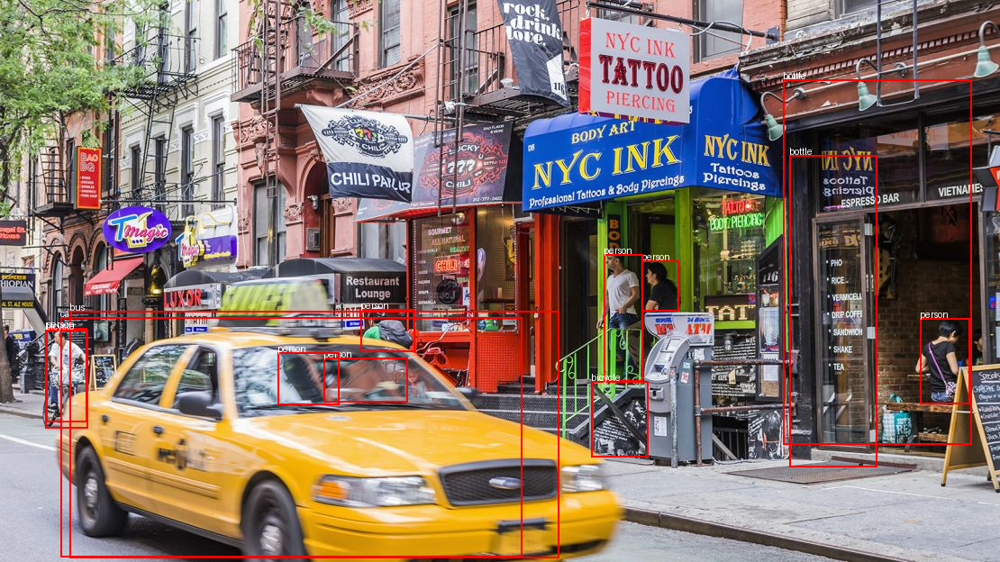

/Users/ojas/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


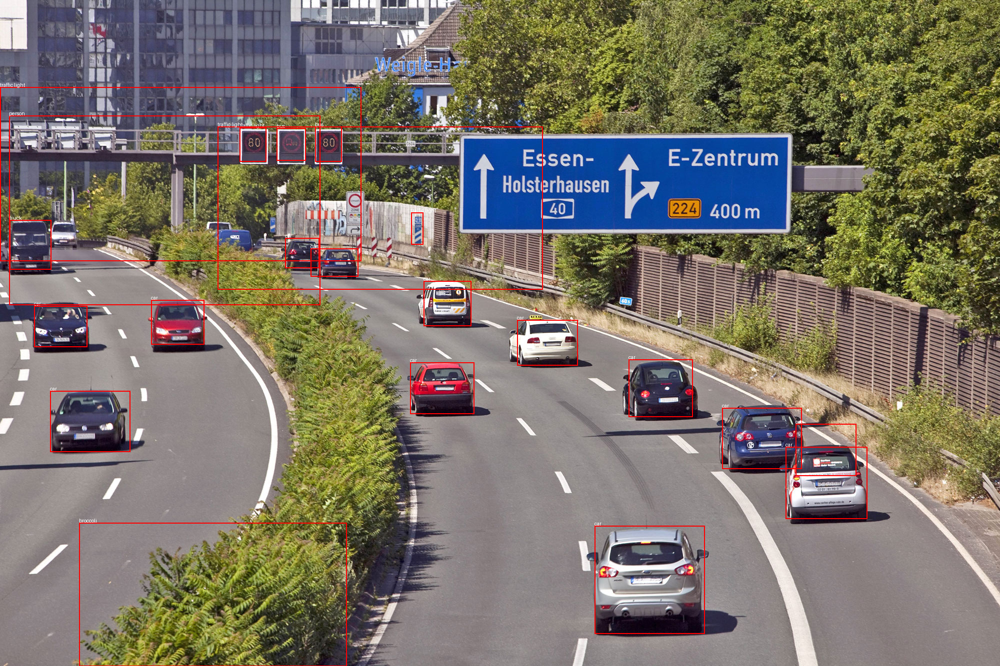

/Users/ojas/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


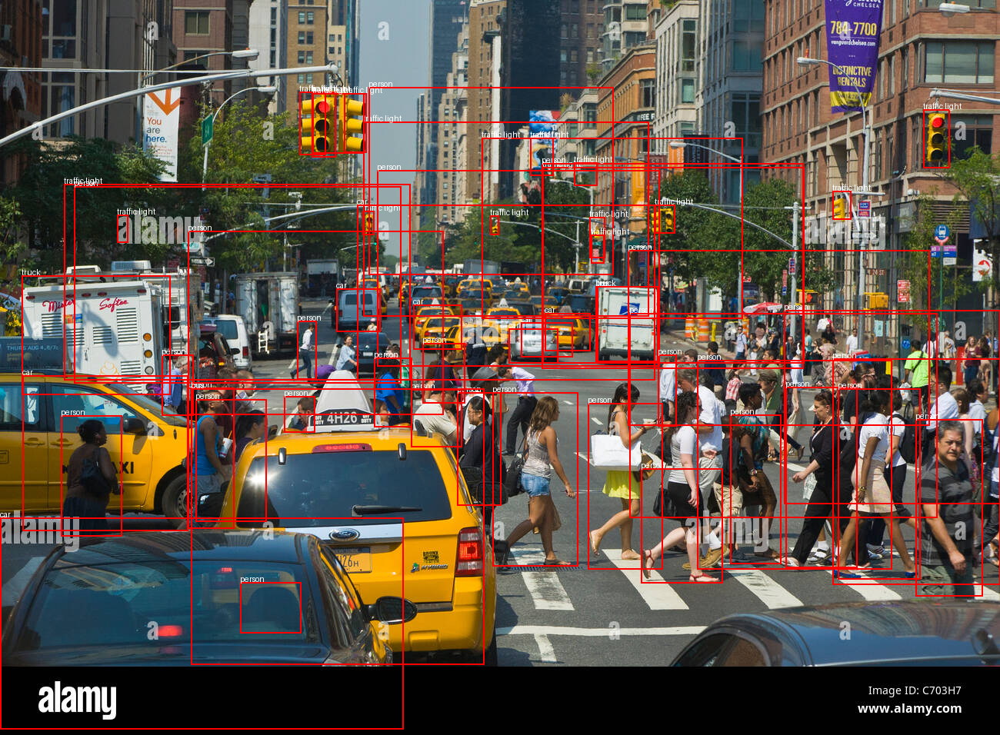

/Users/ojas/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


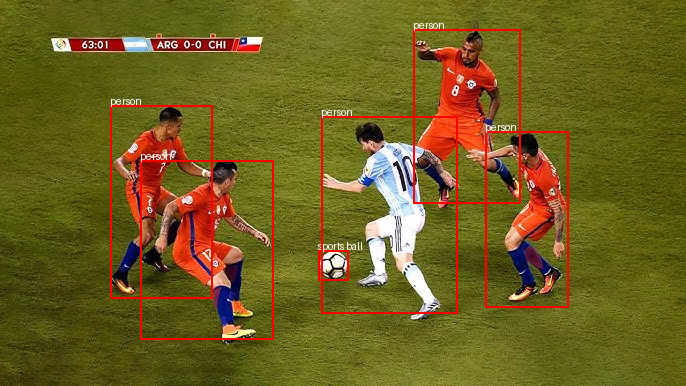

Detection, labeling, and display complete.


In [11]:
from PIL import Image, ImageDraw, ImageFont
from pathlib import Path
from IPython.display import display
import torch

font = ImageFont.load_default()

# Loop through all images in the folder
for img_path in Path(image_folder).glob("*.jpg"):
    img = Image.open(img_path).convert("RGB")
    draw = ImageDraw.Draw(img)
    results = model(img)

    # Plot boxes and labels on the image
    for *box, conf, cls in results.xyxy[0]:  
        label = f'{class_names[int(cls)]} '
        x1, y1, x2, y2 = [int(x) for x in box]
        draw.rectangle([x1, y1, x2, y2], outline="red", width=2)
        draw.text((x1, y1 - 10), label, fill="white", font=font)

    display(img)


print("Detection, labeling, and display complete.")


### Live camera

In [ ]:
# Initialize the webcam
cap = cv2.VideoCapture(0)

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Convert the frame to RGB (YOLOv5 expects RGB images)
    img = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Perform object detection
    results = model(img)

    # Parse the results
    detections = results.xyxy[0].numpy()  

    # Draw bounding boxes and labels on the original frame
    for x1, y1, x2, y2, conf, cls in detections:
        label = f"{model.names[int(cls)]} {conf:.2f}"
        cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        cv2.putText(frame, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Display the frame with detections
    cv2.imshow('YOLOv5 Object Detection', frame)

    # Break the loop if 'q' is pressed
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the webcam and close windows
cap.release()
cv2.destroyAllWindows()


In [ ]:
# Define the categories relevant for a football match and their colors
category_colors = {
    'person': (0, 255, 0),        # Green for players
    'sports ball': (0, 0, 255)    # Red for the ball
}

# Open the video file
video_path = 'test_img/THE GREATEST FINAL EVER_! _ Argentina v France _ FIFA World Cup Qatar 2022 Highlights.mp4'
cap = cv2.VideoCapture(video_path)

# Check if video opened successfully
if not cap.isOpened():
    print("Error: Could not open video.")
    exit()

# Process the video frame by frame
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Run YOLOv5 model on the frame
    results = model(frame)

    # Filter results to include only relevant categories
    filtered_results = results.pandas().xyxy[0]
    filtered_results = filtered_results[filtered_results['name'].isin(category_colors.keys())]

    # Draw bounding boxes for filtered results on the frame
    for _, row in filtered_results.iterrows():
        x1, y1, x2, y2, conf, cls, name = row[['xmin', 'ymin', 'xmax', 'ymax', 'confidence', 'class', 'name']]
        color = category_colors.get(name, (255, 255, 255))  # Default to white if not found
        label = f"{name} {conf:.2f}"
        
        # Draw the bounding box and label
        cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), color, 2)
        cv2.putText(frame, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Display the frame with filtered detections
    cv2.imshow('YOLOv5 Football Detection', frame)

    # Press 'q' to exit the video
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the video capture object and close display window
cap.release()
cv2.destroyAllWindows()


In [ ]:
import cv2

# Define relevant categories and assign each one a unique color (in BGR format)
category_colors = {
    'person': (0, 255, 0),         # Green
    'car': (255, 0, 0),            # Blue
    'bus': (0, 0, 255),            # Red
    'truck': (255, 255, 0),        # Cyan
    'motorcycle': (255, 0, 255),   # Magenta
    'bicycle': (0, 255, 255),      # Yellow
    'traffic light': (128, 0, 128),# Purple
    'fire hydrant': (0, 128, 255), # Orange
    'stop sign': (128, 128, 0),    # Olive
    'bench': (128, 128, 128)       # Gray
}

# Open the video file
video_path = 'test_img/nyc.mp4'
cap = cv2.VideoCapture(video_path)

# Check if video opened successfully
if not cap.isOpened():
    print("Error: Could not open video.")
    exit()

# Get video properties for saving output
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

# Define the codec and create a VideoWriter object to save the processed video
output_path = 'test_img/nyc_output.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

# Process the video frame by frame
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Run YOLOv5 model on the frame
    results = model(frame)

    # Filter results to include only relevant categories
    filtered_results = results.pandas().xyxy[0]
    filtered_results = filtered_results[filtered_results['name'].isin(category_colors.keys())]

    # Draw bounding boxes with specific colors for each category
    for _, row in filtered_results.iterrows():
        x1, y1, x2, y2, conf, cls, name = row[['xmin', 'ymin', 'xmax', 'ymax', 'confidence', 'class', 'name']]
        color = category_colors.get(name, (255, 255, 255))  # Default to white if not found
        label = f"{name} {conf:.2f}"
        
        # Draw the bounding box and label
        cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), color, 2)
        cv2.putText(frame, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Write the processed frame to the output video
    out.write(frame)

    # Display the frame with color-coded detections (optional)
    cv2.imshow('YOLOv5 NYC Night Street Detection', frame)

    # Press 'q' to exit the video
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the video capture and writer objects and close the display window
cap.release()
out.release()
cv2.destroyAllWindows()
